# State By State Comparison Analysis and Regression analysis for Crime rate comparison between urban and rural cities by state over the years

## State by State analysis and Comparison 

### Importing all the required libraries

In [544]:
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline


#### Reading the dataset

#### Notice the dropping of irrelevant columns "Sub-Group and also taking only the first 22 attributes of the dataset so as to ignore the erroneous values in the csv file beyond 22. 

The dataset is also cleaned accordingly by removing the attributes that make the least difference / are repeated

In [545]:
data = pd.read_csv("statewise_crime_dataset.csv", usecols = [i for i in range(0,22) if i not in [3]])

#defining get conviction rate function
def getConvictionRate(row):
    if(row.Cases_Convicted and row.Cases_Trials_Completed):
        row.Conviction_Rate = row.Cases_Convicted/row.Cases_Trials_Completed
    else:
        row.Conviction_Rate = 0
    return row.Conviction_Rate

data.drop(columns=['Cases_charge_sheets_were_not_laid_but_Final_Report_submitted','Cases_Chargesheeted', 'Cases_Withdrawn_by_the_Govt','Cases_withdrawn_by_the_Govt_during_investigation','Cases_Declared_False_on_Account_of_Mistake_of_Fact_or_of_Law', 'Cases_Acquitted_or_Discharged'], inplace = True)

data["Conviction_Rate"] = data.apply(getConvictionRate, axis=1)

### Line Plots by State showing conviction rates for different crimes with total conviction rate in bold

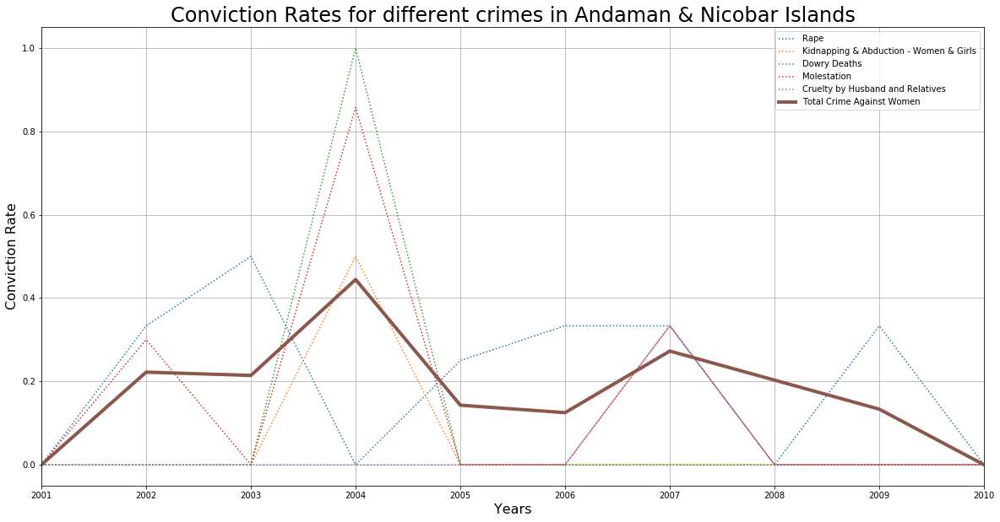

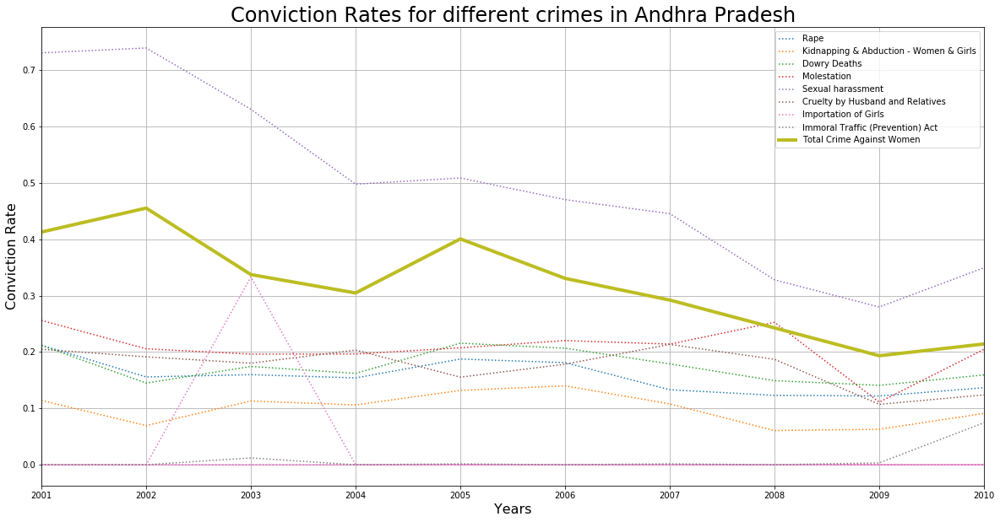

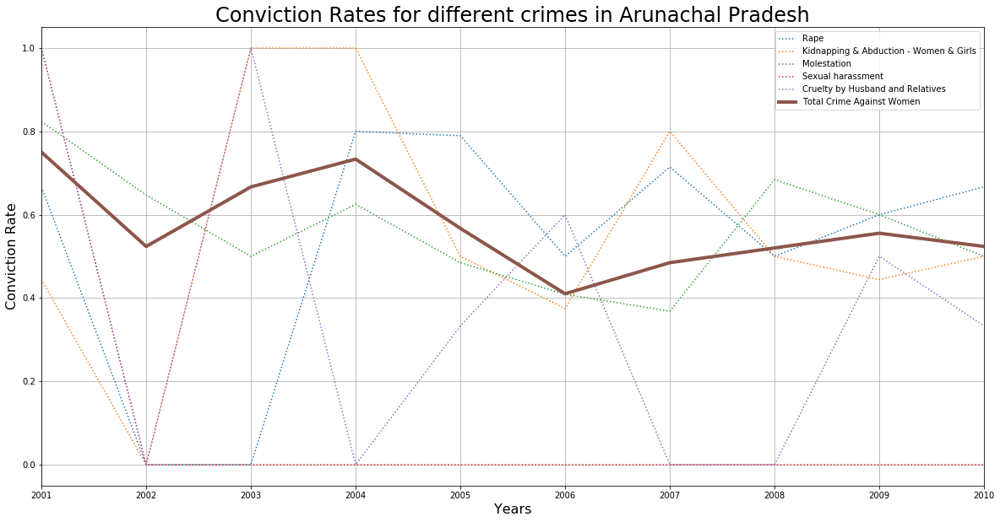

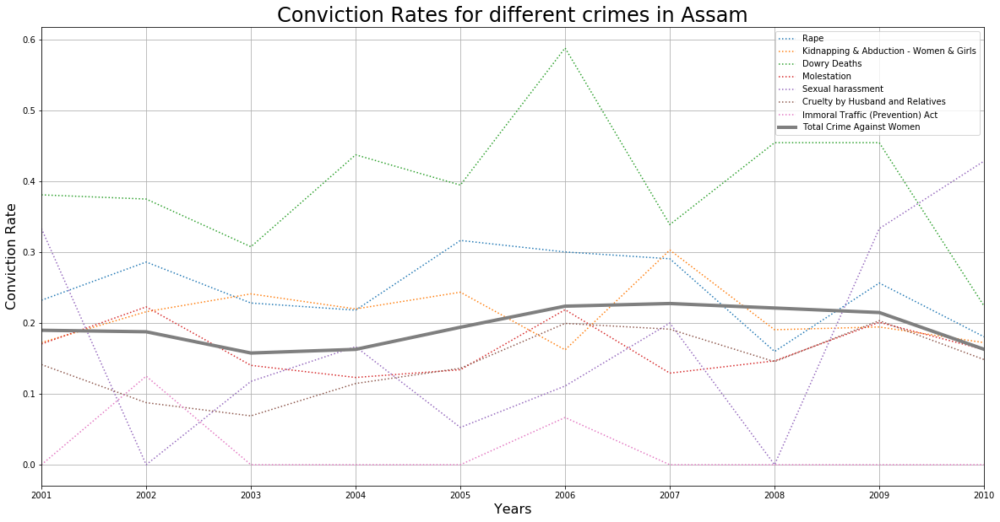

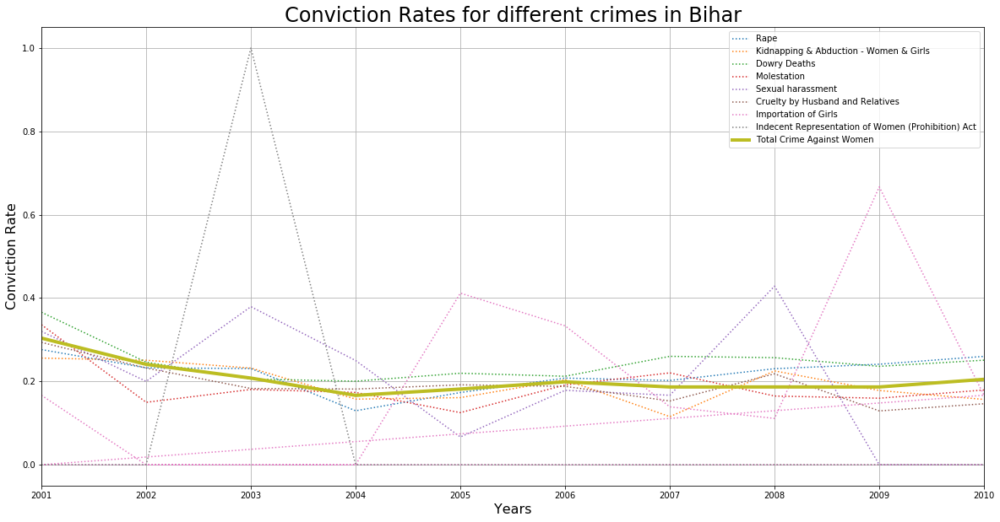

...

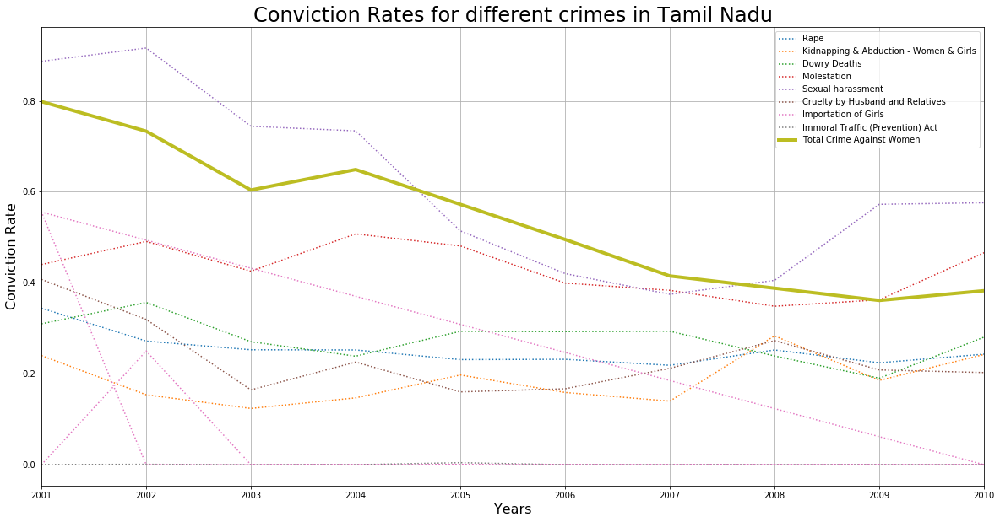

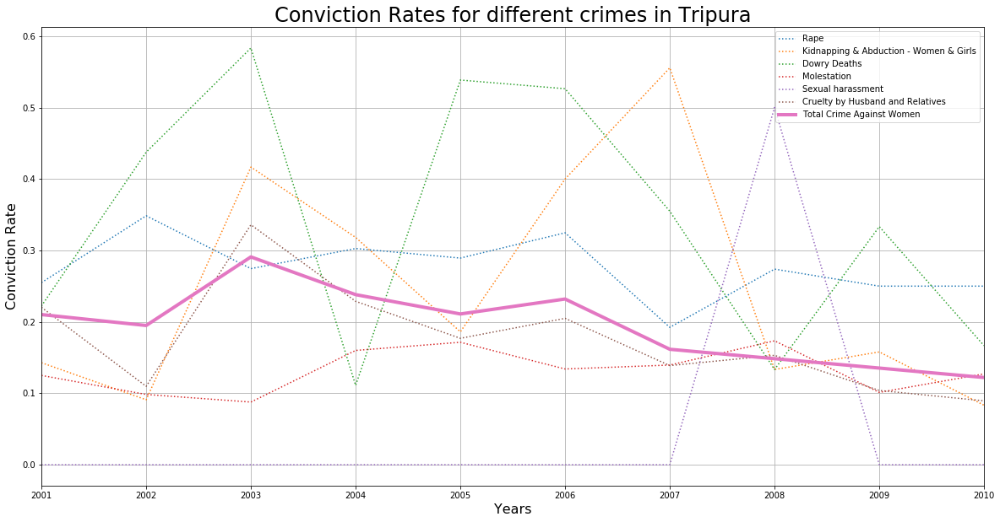

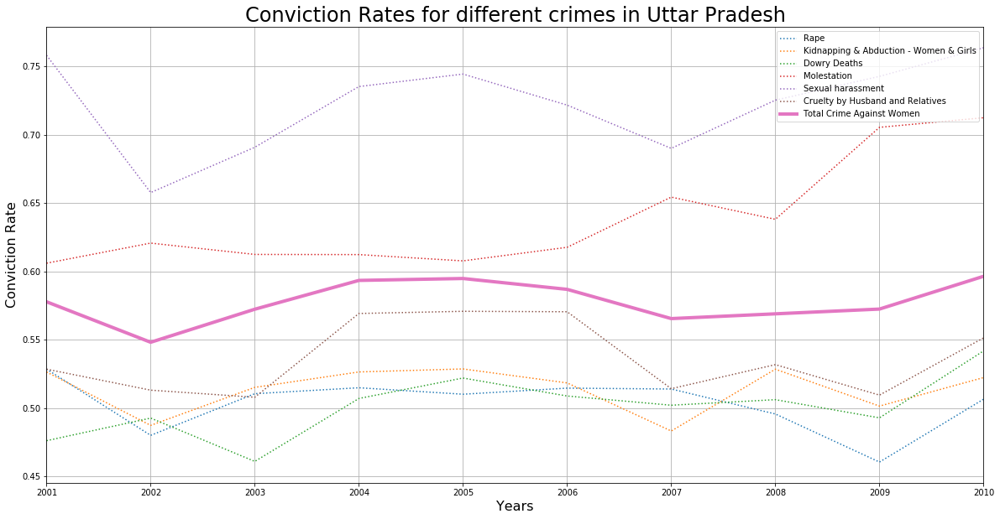

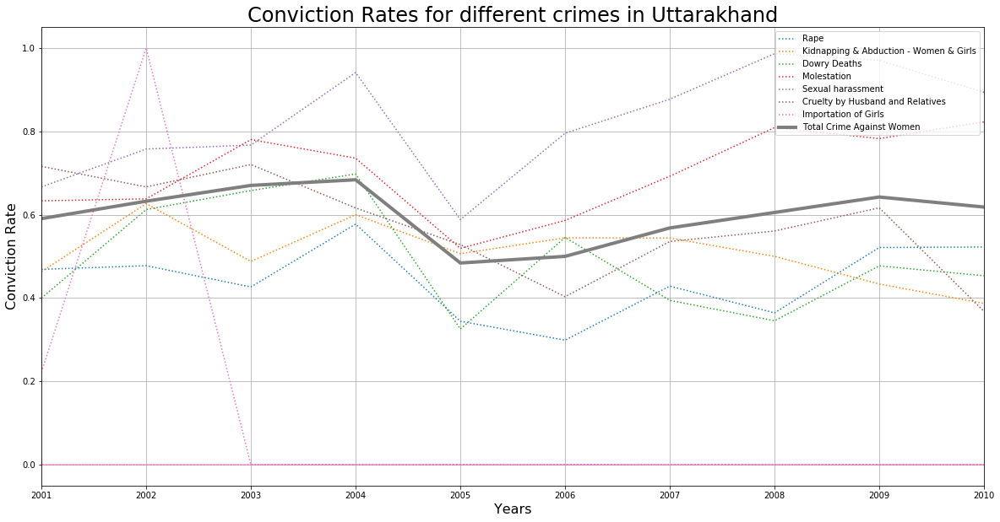

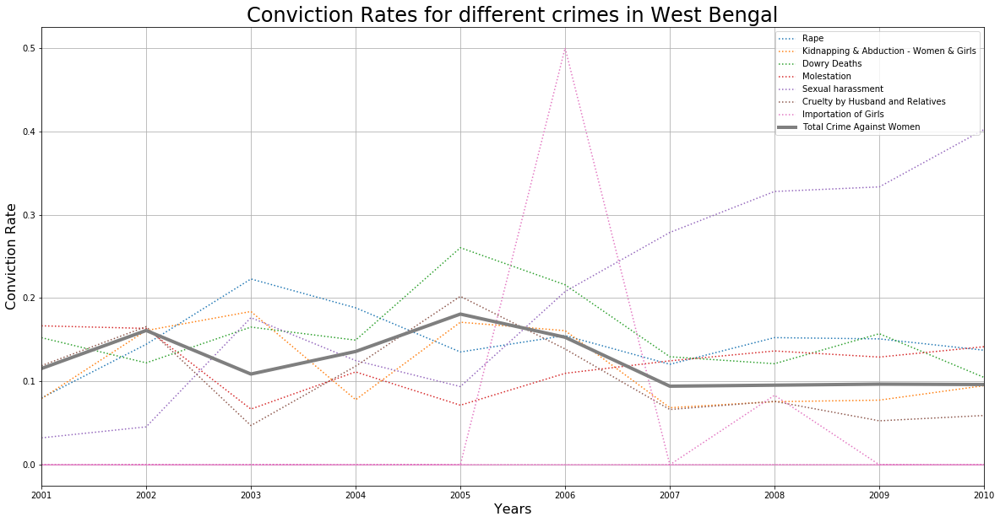

In [546]:
for state in data.Area_Name.unique():
    datacur = data[data['Area_Name'] == state]
    datacur.index = [i for i in range(datacur.shape[0])]
    plt.figure(figsize=(20,10))
    leg = []
    
    for group in datacur.Group_Name.unique():

        df = datacur[datacur.Group_Name == group]
        if(sum(df["Conviction_Rate"]) == 0):
            continue
        if(group == 'Total Crime Against Women'):
            plt.plot(df["Year"], df["Conviction_Rate"], axes = plt.gca(), linewidth = 4)
            leg.append(group)
        else:
            plt.plot(df["Year"], df["Conviction_Rate"], axes = plt.gca(), linestyle = ":")
            leg.append(group)
        
    plt.grid(b=True, which='major', axis='both')
    plt.legend(leg, loc = "upper right")
    plt.title("Conviction Rates for different crimes in " + state, fontsize = 24)
    plt.xlabel("Years", fontsize = 16)
    plt.ylabel("Conviction Rate", fontsize = 16)
    plt.xlim(2001, 2010)
    plt.show()


## Net Justice Rate

Defining court justice rate as (cases with trial completed)/(cases with trial completed + Cases_Pending_Trial_at_Year_End)

Defining police competency rate as (Cases_Investigated_Chargesheets+FR_Submitted)/(Cases_Investigated_Chargesheets+FR_Submitted + Cases_Pending_Investigation_at_Year_End + Cases_not_Investigated_or_in_which_investigation_was_refused)

Net justice rate = court justice rate * police competency rate



### Obtaining the court justice rate for every state

In [547]:
#defining get court justice rate function
def getCourtJusticeRate(row):
    if(row.Cases_Trials_Completed and row.Cases_Pending_Trial_at_Year_End):
        row.CourtJustice_Rate = row.Cases_Trials_Completed/(row.Cases_Trials_Completed + row.Cases_Pending_Trial_at_Year_End)
    else:
        row.CourtJustice_Rate = 0
    return row.CourtJustice_Rate

data["CourtJustice_Rate"] = data.apply(getCourtJusticeRate, axis=1)

In [548]:
#defining get police competency rate function
def getPoliceCompetencyRate(row):
    if(row["Cases_Investigated_Chargesheets+FR_Submitted"] and row.Cases_Pending_Investigation_at_Year_End):
        row.PoliceCompetency_Rate = row["Cases_Investigated_Chargesheets+FR_Submitted"]/(row["Cases_Investigated_Chargesheets+FR_Submitted"] + row.Cases_Pending_Investigation_at_Year_End + row.Cases_not_Investigated_or_in_which_investigation_was_refused)
    else:
        row.PoliceCompetency_Rate = 0
    return row.PoliceCompetency_Rate

data["PoliceCompetency_Rate"] = data.apply(getPoliceCompetencyRate, axis=1)

In [549]:
#defining get net justice rate function
def getNetJusticeRate(row):
    row.NetJustice_Rate = row.CourtJustice_Rate * row.PoliceCompetency_Rate
    return row.NetJustice_Rate

data["NetJustice_Rate"] = data.apply(getNetJusticeRate, axis=1)

### Line Plots by State showing net justice rates for total crimes against women

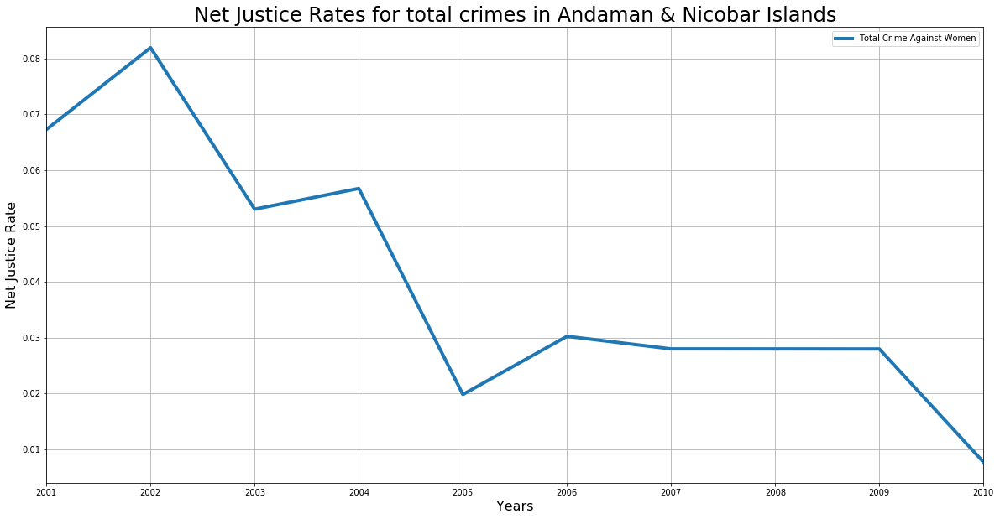

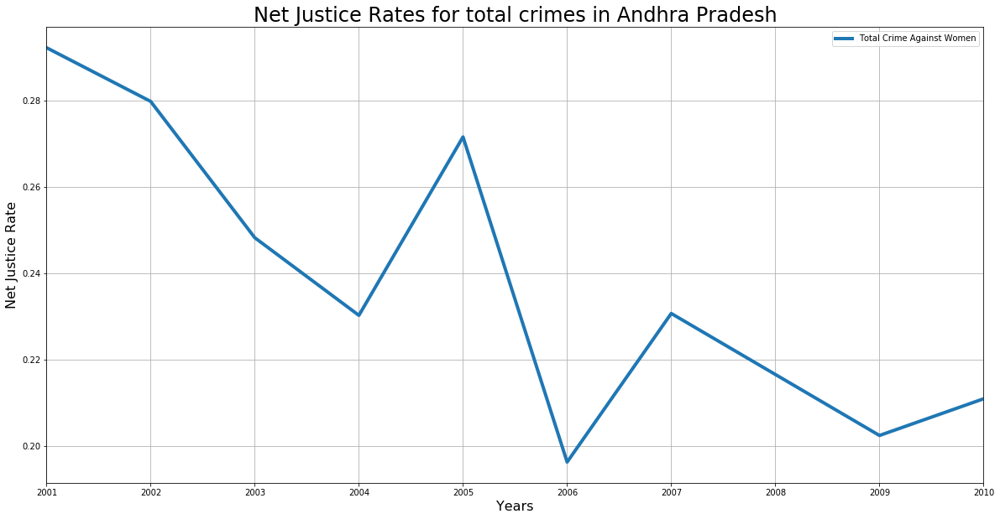

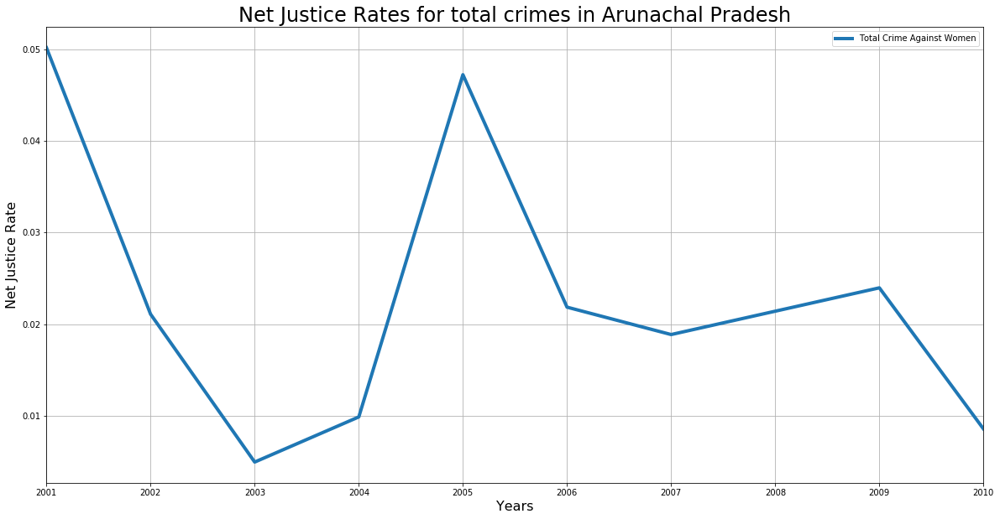

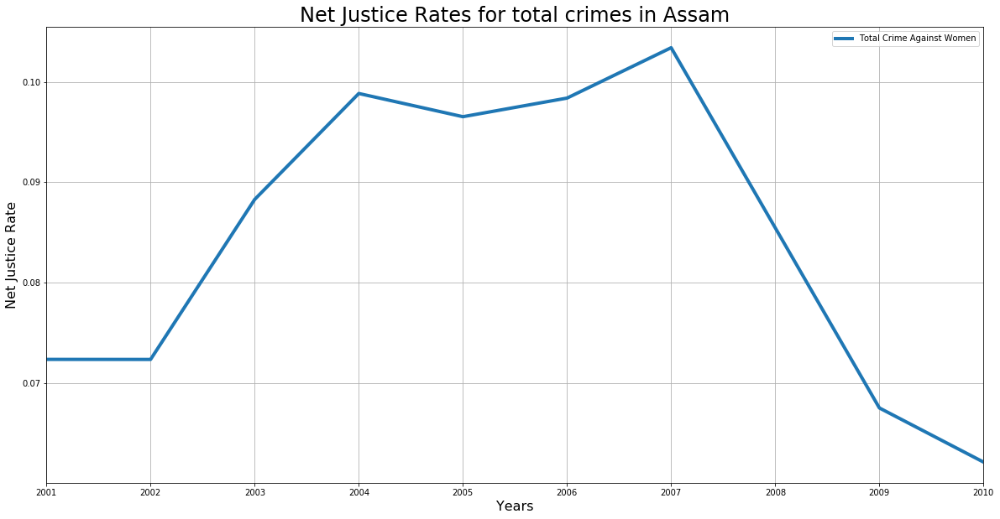

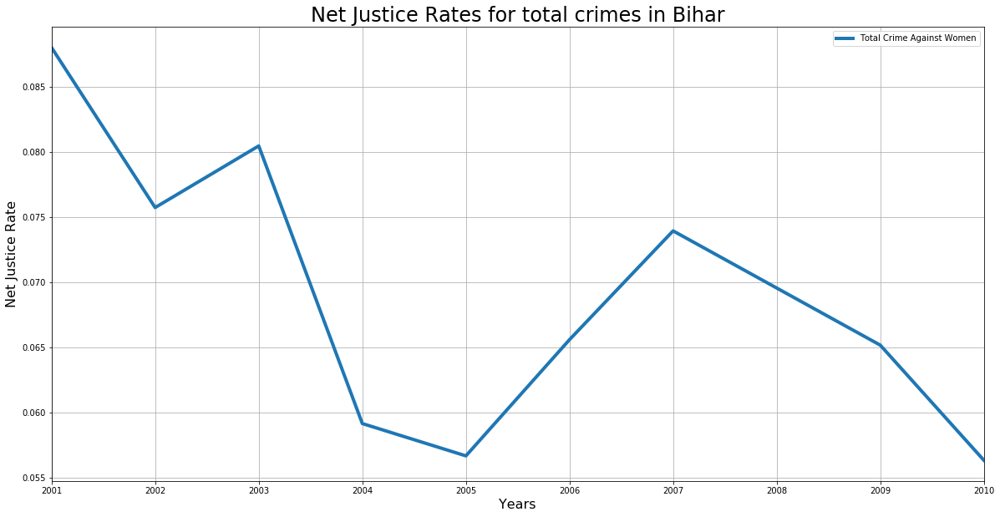

...

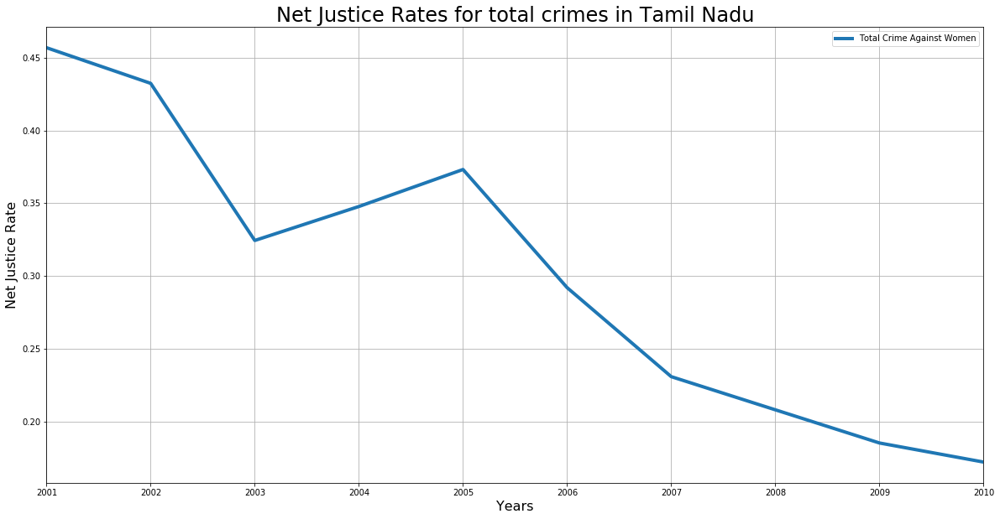

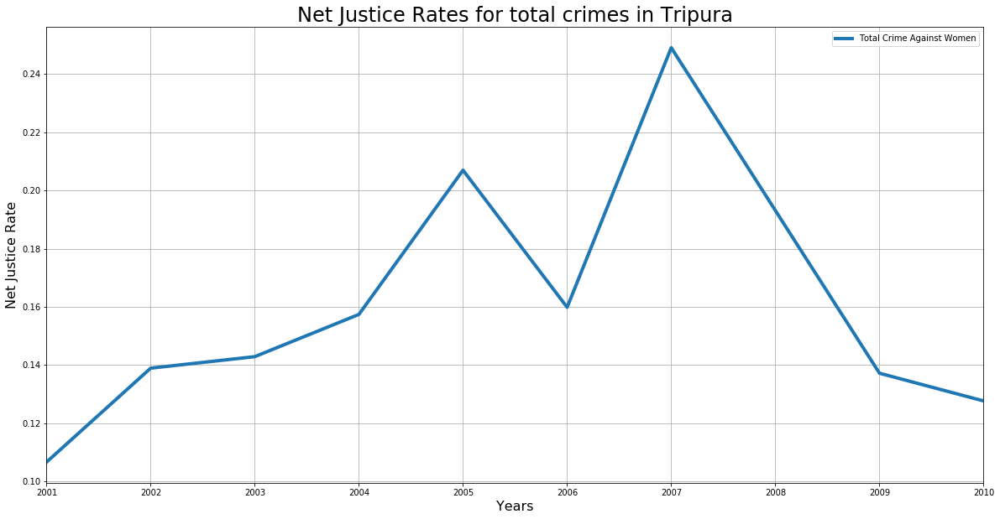

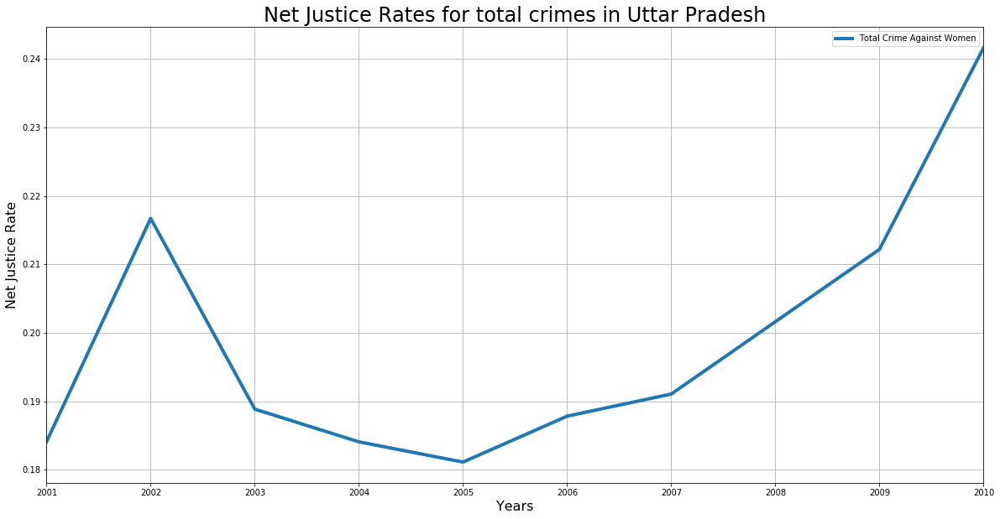

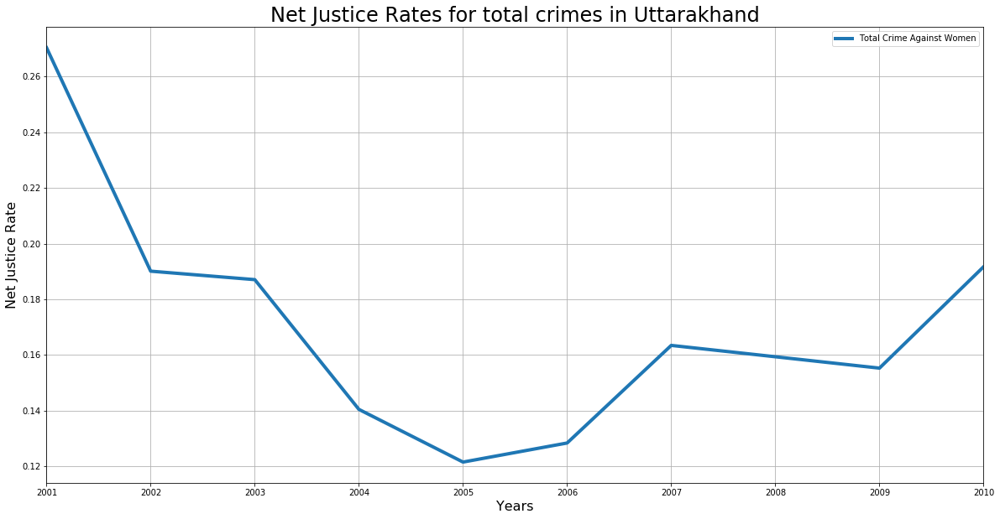

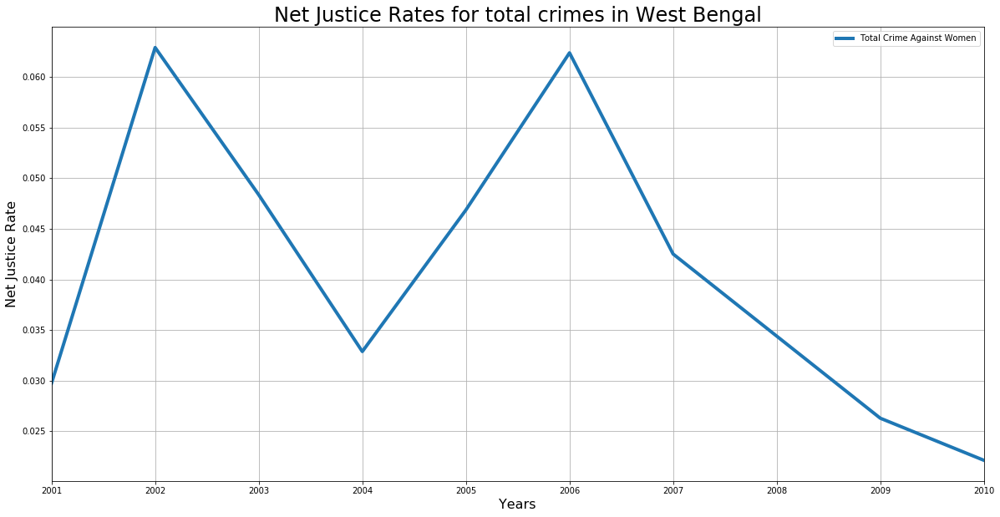

In [550]:
for state in data.Area_Name.unique():
    datacur = data[data['Area_Name'] == state]
    datacur.index = [i for i in range(datacur.shape[0])]
    plt.figure(figsize=(20,10))
    leg = []
    group = 'Total Crime Against Women'
    df = datacur[datacur.Group_Name == group]
    if(sum(df["NetJustice_Rate"]) == 0):
        pass
    else:
        plt.plot(df["Year"], df["NetJustice_Rate"], axes = plt.gca(), linewidth = 4)
        leg.append(group)
        
    plt.grid(b=True, which='major', axis='both')
    plt.legend(leg, loc = "upper right")
    plt.title("Net Justice Rates for total crimes in " + state, fontsize = 24)
    plt.xlabel("Years", fontsize = 16)
    plt.ylabel("Net Justice Rate", fontsize = 16)
    plt.xlim(2001, 2010)
    plt.show()


### Defining net Punishment rates for total crimes against women and normalising it to perform a state by state analysis

In [551]:
#defining get net punishment rate function
def getNetPunishmentRate(row):
    row.NetPunishment_Rate = row.NetJustice_Rate * row.Conviction_Rate
    return row.NetPunishment_Rate

data["NetPunishment_Rate"] = data.apply(getNetPunishmentRate, axis=1)
data["NetPunishment_Rate"] = data["NetPunishment_Rate"]/data["NetPunishment_Rate"].max()
data["NetPunishment_Rate"] = data["NetPunishment_Rate"]*100


### Plotting change in net punishment rate over the years to see if there is any significant change by any of the states.

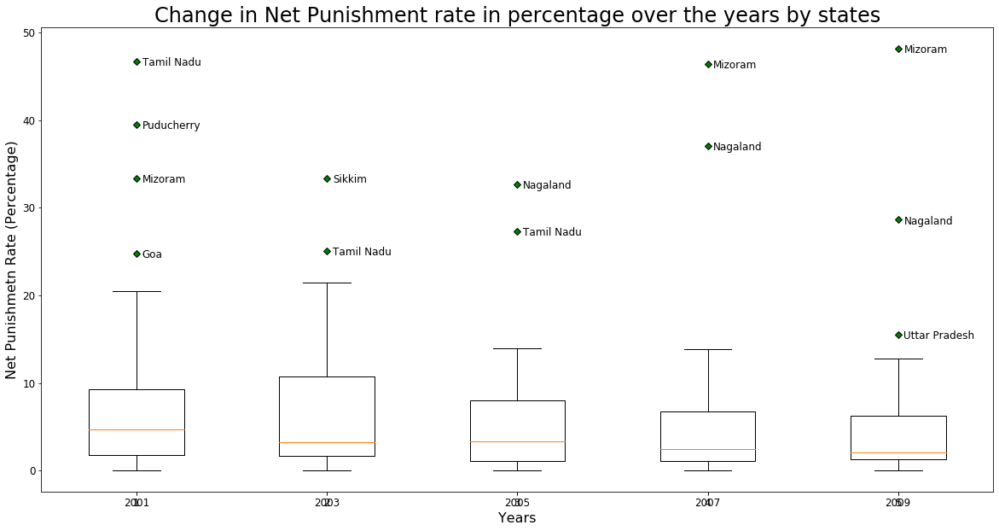

In [552]:
yearwiseStateNetPunishmentRateData = [data[data["Year"] == 2001][data["Group_Name"] == 'Total Crime Against Women']["NetPunishment_Rate"], data[data["Year"] == 2003][data["Group_Name"] == 'Total Crime Against Women']["NetPunishment_Rate"], data[data["Year"] == 2005][data["Group_Name"] == 'Total Crime Against Women']["NetPunishment_Rate"], data[data["Year"] == 2007][data["Group_Name"] == 'Total Crime Against Women']["NetPunishment_Rate"], data[data["Year"] == 2009][data["Group_Name"] == 'Total Crime Against Women']["NetPunishment_Rate"]]

green_diamond = dict(markerfacecolor='g', marker='D')
plt.figure(figsize=(20, 10))
plt.title("Change in Net Punishment rate in percentage over the years by states", fontsize= 24)
plt.xlabel("Years", fontsize= 16)
plt.ylabel("Net Punishmetn Rate (Percentage)", fontsize= 16)
plt.xticks([1, 2, 3, 4, 5], [2001, 2003, 2005, 2007, 2009] , fontsize= 12)
plt.yticks(fontsize = 12)
allBps = plt.boxplot(yearwiseStateNetPunishmentRateData, flierprops=green_diamond)

for i, bp in enumerate(allBps['fliers']):
    for j, ydata in enumerate(bp.get_ydata()):
        plt.text(bp.get_xdata()[j] + 0.03, ydata - 0.5, data[data["Year"] == (2000 + (2*i) + 1)][data["Group_Name"] == 'Total Crime Against Women'][data["NetPunishment_Rate"] == ydata]["Area_Name"].iloc[0], fontsize = 12)


## Regression Analysis between Urban and Rural and on States for different crimes

In [553]:
def linearRegressionModel(XTrain, Xtest, yTrain, yTest, alpha, iterations):
    #defining cost function as sigma(y(hat) - y)^2/2*n
    def cost_function(X, y, weights):
        nElements = len(y)
        cost = np.sum((X.dot(weights) - y) ** 2)/(2 * nElements)
        return cost

    #defining batch gradient descent to help learning of the weights in batches
    def batchGradientDescent(X, y, weights, alpha, iterations):
        costHistory = []
        nElements = len(y)
        for iteration in range(iterations):
            yHat = X.dot(weights)
            error = yHat - y
            gradient = X.T.dot(error)/nElements

            weights = weights - alpha*gradient

            cost = cost_function(X, y, weights)
            costHistory.append(cost)

        return weights, costHistory

    # Initializing the coefficients
    weights = np.zeros(XTrain.shape[1])

    #training the model
    learnedWeights , costHistory = batchGradientDescent(XTrain, yTrain, weights, alpha, iterations)

    #testing the model
    def prediction(X, weights):
        return X.dot(weights)

    yPred = prediction(XTest, learnedWeights)

    #checking model using R^2 score

    def R2(yPredicted, yActual):
        sst = np.sum((yActual - yActual.mean())**2)
        ssr = np.sum((yPred - yActual)**2)

        r2 = 1 - (ssr/sst)
        return r2

    r2Value = R2(yPred, yTest)

    return r2Value


### Modifying dataset to allow for multiple linear regression by:-
 1. encoding different catergorical variables into nominal ones
 2. normalising and transforming the X vector which contains the attributes

 And finally shuffling the dataset to remove the inherent ordering and to allow for random rows for training adn testing with equal probablity of being in both

In [554]:
from sklearn.preprocessing import StandardScaler

dataReg = data.iloc[:, :3]

'''
features :-
1. year
2. state
3. group name 
4. Net Punishment rate
'''

#encoding the features
# year -> year - 2000
# state -> 1-30
# group name -> 1-11

encodingState = {}
i = 1
for state in dataReg.Area_Name.unique():
    encodingState[state] = i
    i += 1

encodingGroup = {}
i = 1
for group in dataReg.Group_Name.unique():
    encodingGroup[group] = i
    i += 1

encodingYears = {}
i = 1
for year in dataReg.Year.unique():
    encodingYears[year] = i
    i += 1

dataReg["Area_Name"] = dataReg["Area_Name"].apply(lambda x : encodingState[x])
dataReg["Group_Name"] = dataReg["Group_Name"].apply(lambda x : encodingGroup[x])
dataReg["Year"] = dataReg["Year"].apply(lambda x : encodingYears[x])

dataReg["NetPunishment_Rate"] = data["NetPunishment_Rate"]
dataReg["Cases_Reported"] = data["Cases_Reported"]

dataReg = dataReg.sample(frac = 1)



### Plotting regression model analysis on different crimes by using different test train split to determine the best model based on R^2 score

### Note : Run Code to find R^2 score plots using different train-test split for different crimes

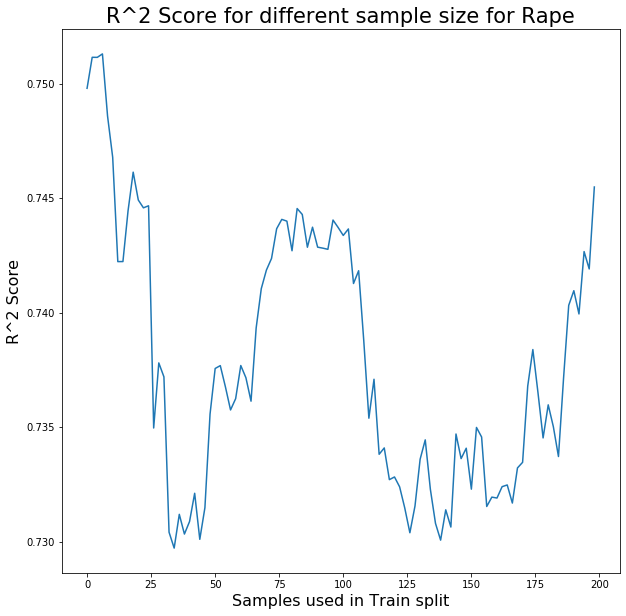

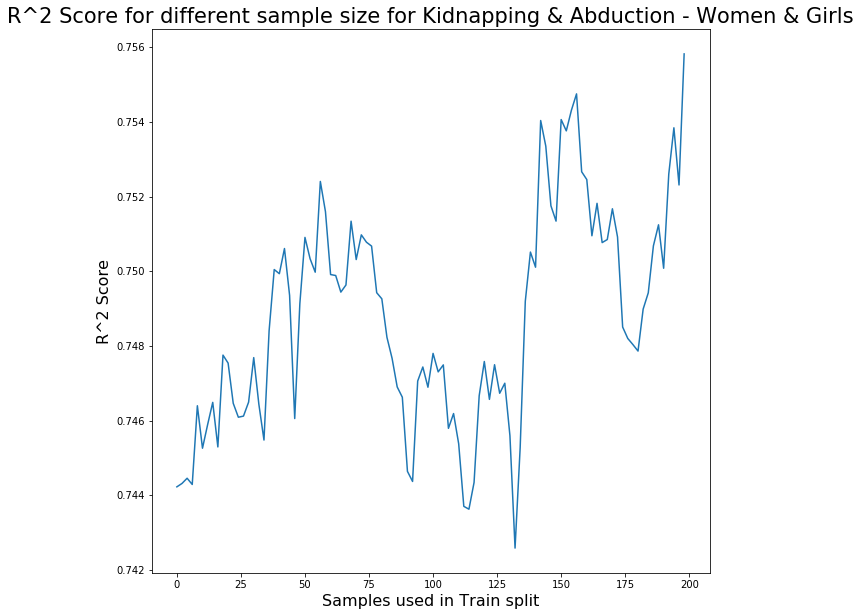

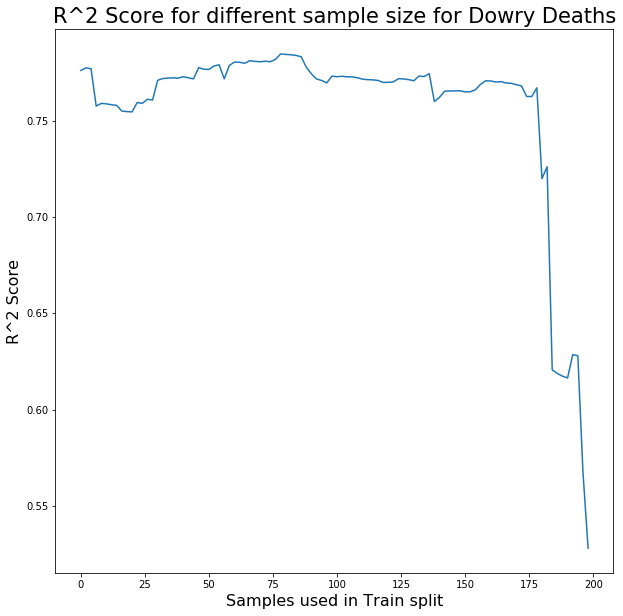

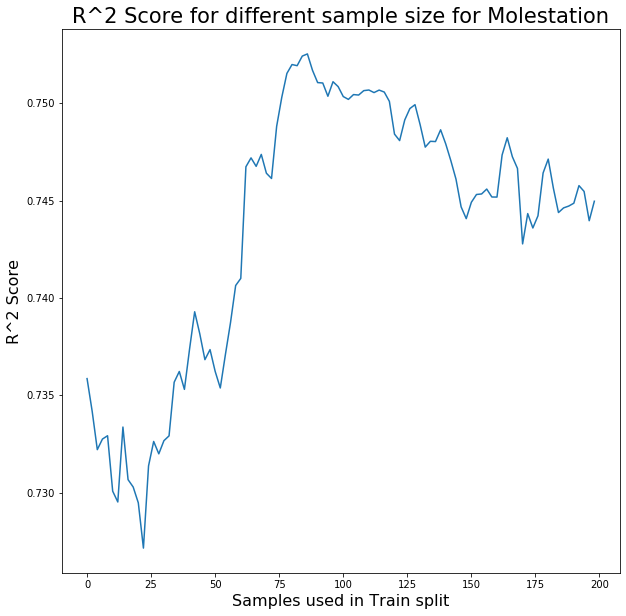

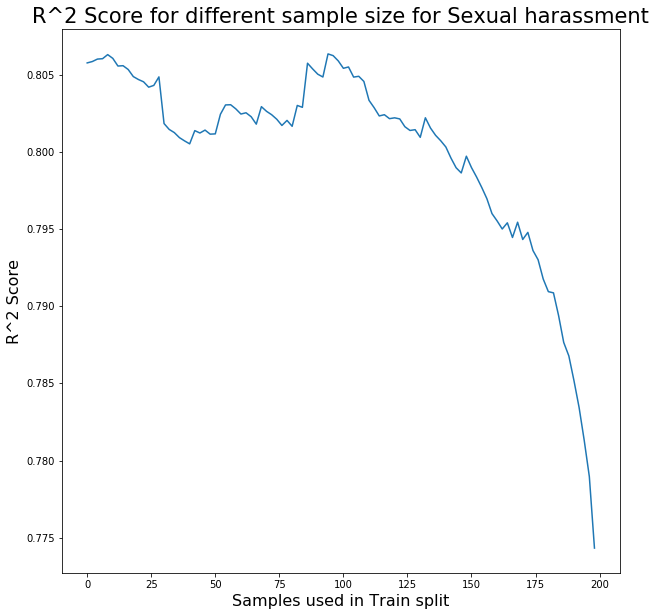

...

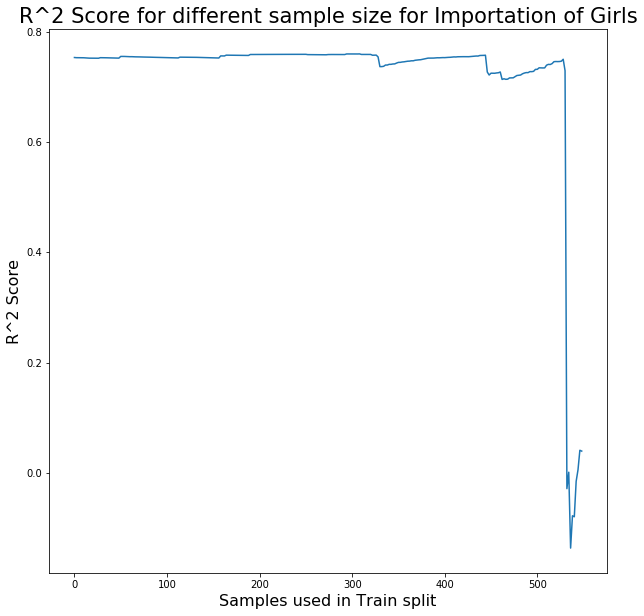

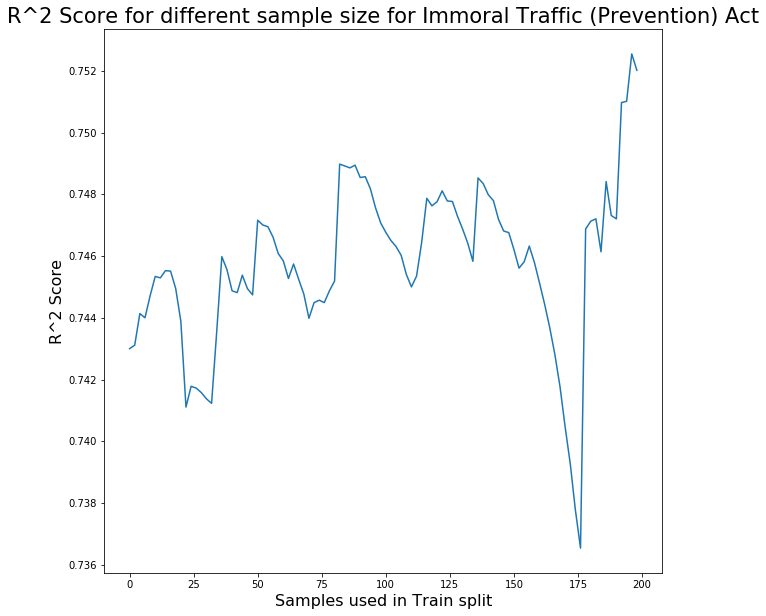

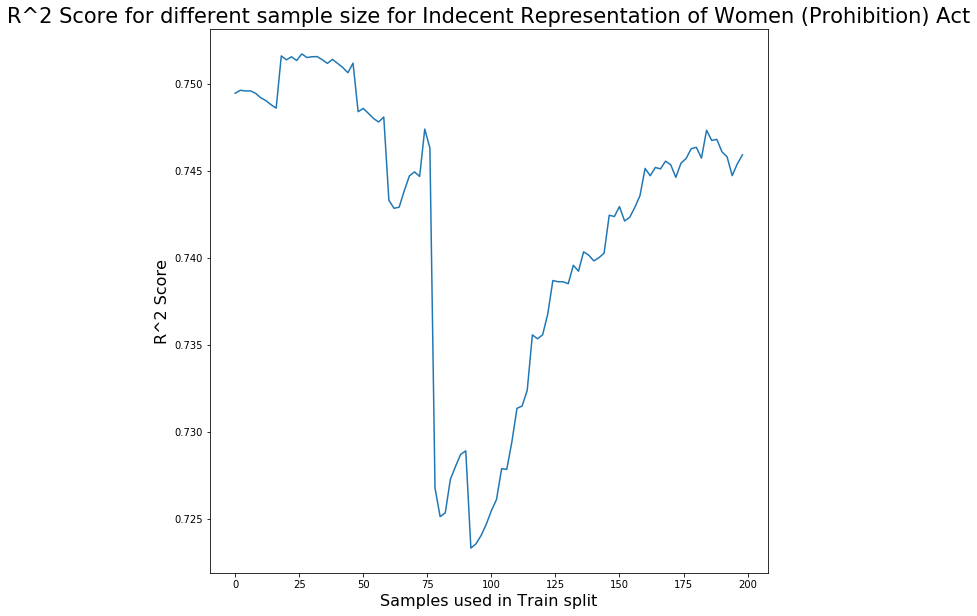

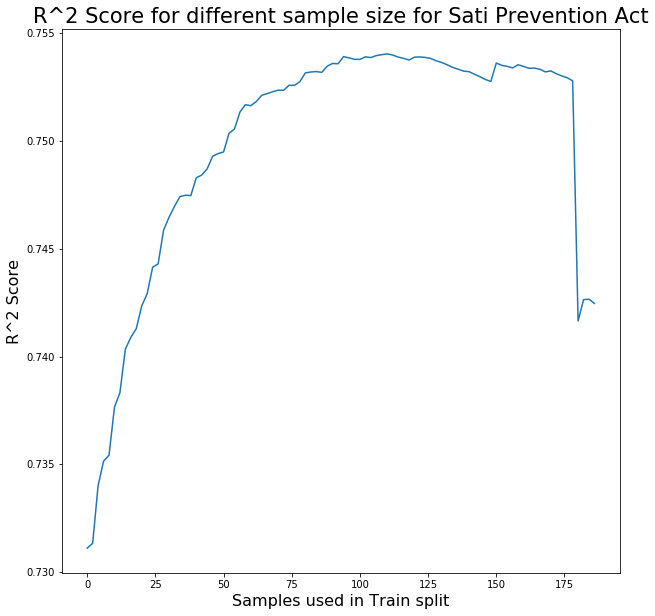

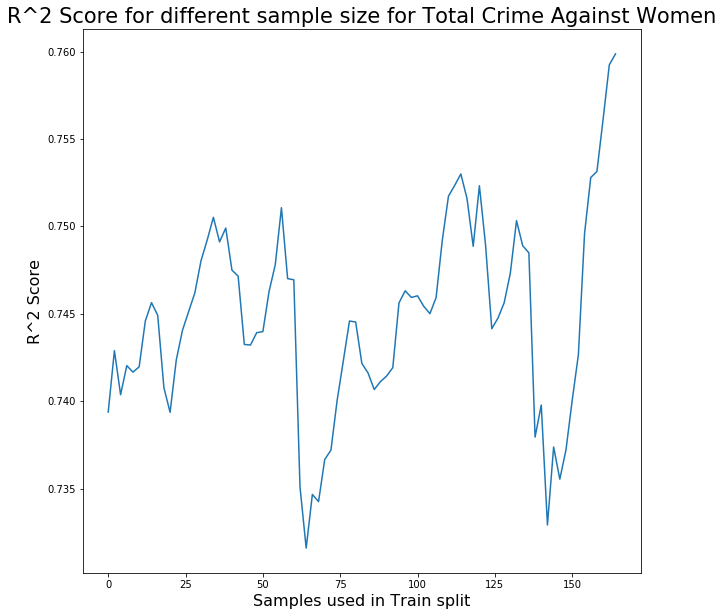

In [555]:
for group in range(1, 12):
    X = dataReg[dataReg["Group_Name"] == group].iloc[:, :4]
    y = np.array(dataReg[dataReg["Group_Name"] == group]["Cases_Reported"])

    sc = StandardScaler()
    X = sc.fit_transform(X)

    #using r2 score to get best test train split

    rscore = []
    for split in range(100, dataReg[dataReg["Group_Name"] == group]["Group_Name"].value_counts().iloc[0]- 50, 2):
        XTrain = X[:split]
        XTrain = np.c_[np.ones(len(XTrain),dtype='int64'),XTrain]

        yTrain = y[:split]

        XTest = X[split:]
        XTest = np.c_[np.ones(len(XTest),dtype='int64'),XTest]

        yTest = y[split:]

        rscore.append(linearRegressionModel(XTrain, XTest, yTrain, yTest, 0.05, 1000))

    xgraph = []
    rscore = np.array(rscore)
    rscore += 3
    rscore /= 4
    for i in range(len(rscore)):
        xgraph.append(2*i)

    plt.figure(figsize=(10,10))
    plt.plot(xgraph, rscore)
    plt.title("R^2 Score for different sample size for " + data.Group_Name.unique()[group-1], fontsize = 21)
    plt.ylabel("R^2 Score", fontsize = 16)
    plt.xlabel("Samples used in Train split", fontsize = 16)
    plt.show()


### Comparing Rate of Growth of different crimes in cities vs rural of particular states to check for significant difference

#### State in Point - Rajasthan 
#### Crime in point  - Rape

Overall state growth rate

Equation of growth of Rapes in Rajasthan state is :-

[  Rapes_reported = 87.52447552447552 X + 747.5909090909091  ]

 where x : Years encoded by subtracting 2000

With an R^2 score of : 0.8220289546303992



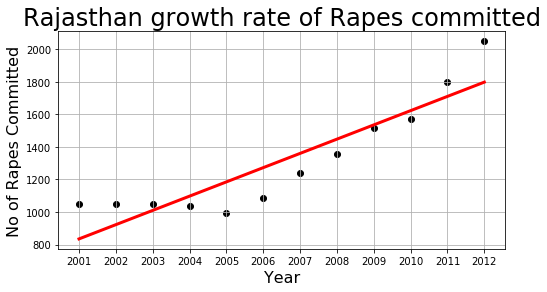

In [556]:
from sklearn.linear_model import LinearRegression

dataStates = pd.read_csv("district_2001-12.csv")

dataRaj = dataStates[dataStates["STATE/UT"] == "RAJASTHAN"][dataStates["DISTRICT"] == "TOTAL"]
dataRaj.reset_index(inplace=True)
dataRaj["Year"].replace([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace = True)

X = np.array(dataRaj["Year"]).reshape((-1, 1))
y = np.array(dataRaj["Rape"])


model = LinearRegression()
model.fit(X, y)
r2 = model.score(X, y)
yHat = model.predict(X)

slope = model.coef_[0]
intercept = model.intercept_

print("Equation of growth of Rapes in Rajasthan state is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\nWith an R^2 score of : {r2}\n".format(slp = slope, inter = intercept, r2 = r2))

plt.figure(figsize=(8,4))
plt.scatter(X, y,  color='black')
plt.plot(X, yHat, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Rajasthan growth rate of Rapes committed", fontsize = 24)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.show()

Urban Cities : Jodhpur, Kota

Rural Areas : Alwar, Bharatpur
 

### Obtaining Data for all the 4 cities and encoding the years and plotting their average groeth rate calculated using SIMPLE LINEAR REGRESSION

---------JODHPUR-------



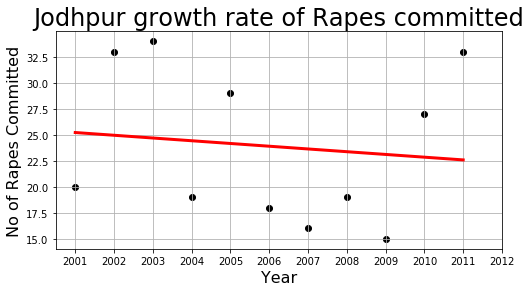


Equation of growth of Rapes in Jodhpur city is :-

[  Rapes_reported = -0.26363636363636384 X + 25.490909090909092  ]

 where x : Years encoded by subtracting 2000

With an R^2 score of : 0.014082384460816888


---------KOTA-------



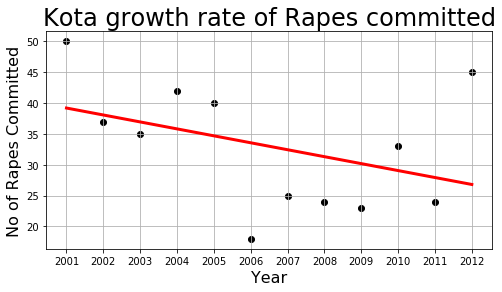


Equation of growth of Rapes in Kota city is :-

[  Rapes_reported = -1.1258741258741256 X + 40.31818181818181  ]

 where x : Years encoded by subtracting 2000

With an R^2 score of : 0.15984632651299335


---------ALWAR-------



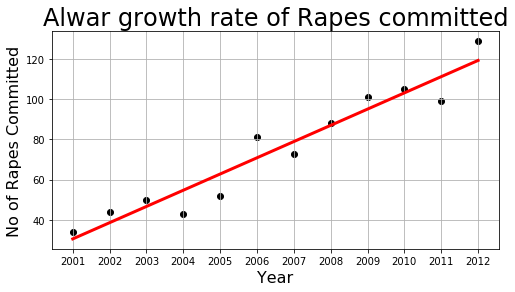


Equation of growth of Rapes in Alwar city is :-

[  Rapes_reported = 8.094405594405593 X + 22.30303030303031  ]

 where x : Years encoded by subtracting 2000

With an R^2 score of : 0.9279342184189373


---------BHARATPUR-------



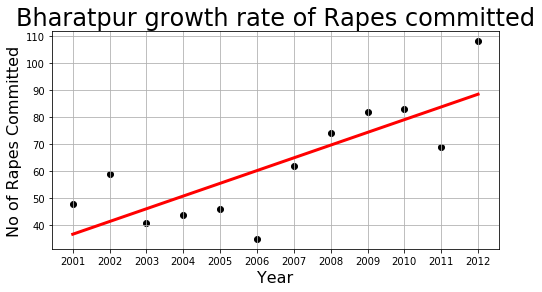


Equation of growth of Rapes in Bharatpur city is :-

[  Rapes_reported = 4.702797202797202 X + 32.01515151515153  ]

 where x : Years encoded by subtracting 2000

With an R^2 score of : 0.6200123086793782




In [557]:


# getting jodhpur data
dataJodhpur = dataStates[dataStates["DISTRICT"] == 'JODHPUR']
dataJodhpur.reset_index()
dataJodhpur2 = dataStates[dataStates["DISTRICT"] == 'JODHPUR CITY']
dataJodhpur2.reset_index(drop = True)
dataJodhpur = pd.concat([dataJodhpur, dataJodhpur2], axis = 0)
dataJodhpur["DISTRICT"].replace("JODHPUR CITY", 'JODHPUR', inplace = True)
dataJodhpur["Year"].replace([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace = True)

# getting kota data
dataKota = dataStates[dataStates["DISTRICT"] == 'KOTA']
dataKota.reset_index()
dataKota2 = dataStates[dataStates["DISTRICT"] == 'KOTA CITY']
dataKota2.reset_index(drop = True)
dataKota = pd.concat([dataKota, dataKota2], axis = 0)
dataKota["DISTRICT"].replace("KOTA CITY", 'KOTA', inplace = True)
dataKota["Year"].replace([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace = True)

# getting alwar data
dataAlwar = dataStates[dataStates["DISTRICT"] == 'ALWAR']
dataAlwar.reset_index()
dataAlwar["Year"].replace([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace = True)

# getting bharatpur data
dataBharatpur = dataStates[dataStates["DISTRICT"] == 'BHARATPUR']
dataBharatpur.reset_index()
dataBharatpur["Year"].replace([2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], inplace = True)

XJodhpur = np.array(dataJodhpur["Year"]).reshape((-1, 1))
yJodhpur = np.array(dataJodhpur["Rape"])

modelJodhpur = LinearRegression()
modelJodhpur.fit(XJodhpur, yJodhpur)
r2Jodhpur = modelJodhpur.score(XJodhpur, yJodhpur)
yHatJodhpur = modelJodhpur.predict(XJodhpur)

slopeJodhpur = modelJodhpur.coef_[0]
interceptJodhpur = modelJodhpur.intercept_

print("---------JODHPUR-------\n")

plt.figure(figsize=(8,4))
plt.scatter(XJodhpur, yJodhpur,  color='black')
plt.plot(XJodhpur, yHatJodhpur, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Jodhpur growth rate of Rapes committed", fontsize = 24)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.show()

print("\nEquation of growth of Rapes in Jodhpur city is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\nWith an R^2 score of : {r2}\n\n".format(slp = slopeJodhpur, inter = interceptJodhpur, r2 = r2Jodhpur ))

XKota = np.array(dataKota["Year"]).reshape((-1, 1))
yKota = np.array(dataKota["Rape"])

modelKota = LinearRegression()
modelKota.fit(XKota, yKota)
r2Kota = modelKota.score(XKota, yKota)
yHatKota = modelKota.predict(XKota)

slopeKota = modelKota.coef_[0]
interceptKota = modelKota.intercept_

print("---------KOTA-------\n")

plt.figure(figsize=(8,4))
plt.scatter(XKota, yKota,  color='black')
plt.plot(XKota, yHatKota, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Kota growth rate of Rapes committed", fontsize = 24)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.show()

print("\nEquation of growth of Rapes in Kota city is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\nWith an R^2 score of : {r2}\n\n".format(slp = slopeKota, inter = interceptKota, r2 = r2Kota))

XAlwar = np.array(dataAlwar["Year"]).reshape((-1, 1))
yAlwar = np.array(dataAlwar["Rape"])

modelAlwar = LinearRegression()
modelAlwar.fit(XAlwar, yAlwar)
r2Alwar = modelAlwar.score(XAlwar, yAlwar)
yHatAlwar = modelAlwar.predict(XAlwar)

slopeAlwar = modelAlwar.coef_[0]
interceptAlwar = modelAlwar.intercept_

print("---------ALWAR-------\n")

plt.figure(figsize=(8,4))
plt.scatter(XAlwar, yAlwar,  color='black')
plt.plot(XAlwar, yHatAlwar, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Alwar growth rate of Rapes committed", fontsize = 24)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.show()

print("\nEquation of growth of Rapes in Alwar city is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\nWith an R^2 score of : {r2}\n\n".format(slp = slopeAlwar, inter = interceptAlwar, r2 = r2Alwar))

XBharatpur = np.array(dataBharatpur["Year"]).reshape((-1, 1))
yBharatpur = np.array(dataBharatpur["Rape"])

modelBharatpur = LinearRegression()
modelBharatpur.fit(XBharatpur, yBharatpur)
r2Bharatpur = modelBharatpur.score(XBharatpur, yBharatpur)
yHatBharatpur = modelBharatpur.predict(XBharatpur)

slopeBharatpur = modelBharatpur.coef_[0]
interceptBharatpur = modelBharatpur.intercept_

print("---------BHARATPUR-------\n")

plt.figure(figsize=(8,4))
plt.scatter(XBharatpur, yBharatpur,  color='black')
plt.plot(XBharatpur, yHatBharatpur, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Bharatpur growth rate of Rapes committed", fontsize = 24)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.show()

print("\nEquation of growth of Rapes in Bharatpur city is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\nWith an R^2 score of : {r2}\n\n".format(slp = slopeBharatpur, inter = interceptBharatpur, r2 = r2Bharatpur))

### Comparing the growth rate between urban and rural areas

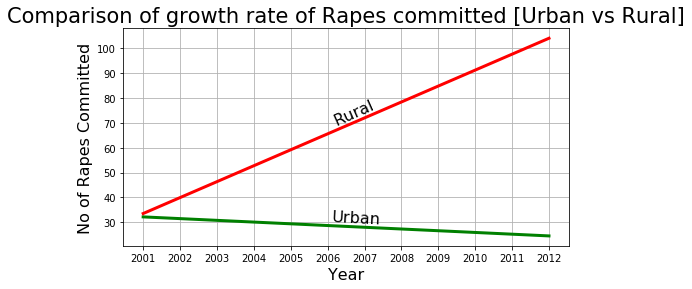


Equation of growth of Rapes in Urban area is :-

[  Rapes_reported = -0.6947552447552447 X + 32.904545454545456  ]

 where x : Years encoded by subtracting 2000



Equation of growth of Rapes in Rural area is :-

[  Rapes_reported = 6.398601398601397 X + 27.15909090909092  ]

 where x : Years encoded by subtracting 2000




In [558]:
averageUrbanSlope = (slopeJodhpur + slopeKota)/2
averageUrbanIntercept = (interceptJodhpur + interceptKota)/2

averageRuralSlope = (slopeBharatpur + slopeAlwar)/2
averageRuralIntercept = (interceptBharatpur + interceptAlwar)/2

Xcomparison = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Xcomparison = np.array(Xcomparison)

yUrban = Xcomparison*averageUrbanSlope + averageUrbanIntercept

yRural = Xcomparison*averageRuralSlope + averageRuralIntercept

plt.figure(figsize=(8,4))
plt.plot(Xcomparison, yUrban, color='green', linewidth=3)
plt.plot(Xcomparison, yRural, color='red', linewidth=3)
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], [2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012])
plt.grid(which='major', b = True)
plt.title("Comparison of growth rate of Rapes committed [Urban vs Rural]", fontsize = 21)
plt.ylabel("No of Rapes Committed", fontsize = 16)
plt.xlabel("Year", fontsize = 16)
plt.text(6.1, 69, "Rural", rotation = 24, fontsize = 16)
plt.text(6.1, 29.5, "Urban", rotation = -3, fontsize = 16)
plt.show()

print("\nEquation of growth of Rapes in Urban area is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\n".format(slp = averageUrbanSlope, inter = averageUrbanIntercept))

print("\nEquation of growth of Rapes in Rural area is :-\n\n[  Rapes_reported = {slp} X + {inter}  ]\n\n where x : Years encoded by subtracting 2000\n\n".format(slp = averageRuralSlope, inter = averageRuralIntercept))